In [3]:
!brew install graphviz
!pip install torchviz

/bin/bash: brew: command not found
  Preparing metadata (setup.py) ... done
  Created wheel for torchviz: filename=torchviz-0.0.2-py3-none-any.whl size=4131 sha256=627fedf5d5e66fb79d178415910d748336d78ee53c45ef0fddf33eeb62cf898d
  Stored in directory: /root/.cache/pip/wheels/4c/97/88/a02973217949e0db0c9f4346d154085f4725f99c4f15a87094
Successfully built torchviz


In [4]:
import torch
from torch import nn as NN
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import torchdata

import torchvision
from torchvision import transforms as T
from torchvision.models import resnet34
from torchvision.transforms.functional import pil_to_tensor, to_pil_image

from PIL import Image

import os
from enum import Enum
from dataclasses import dataclass, field
from typing import List

from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

from torchviz import make_dot
from typing import List, Tuple
import json

import warnings
warnings.filterwarnings('ignore')


In [5]:
!mkdir ./train_x_tensored
!mkdir ./train_y_tensored


# Classes

In [27]:
@dataclass
class TrainResults:
    model_name: str
    train_losses: List[float] = field(default_factory=list)
    test_losses:  List[float] = field(default_factory=list)

        
@dataclass(frozen=True)
class Pathes:
    train_labels_path: str = '/kaggle/input/cassava-leaf-disease-classification/train.csv'
    train_data_path: str = '/kaggle/input/cassava-leaf-disease-classification/train_images/'
    tensored_data_path = './train_x_tensored/'
    desease_index_name_pair_path: str = '/kaggle/input/cassava-leaf-disease-classification/label_num_to_disease_map.json'

        
@dataclass(frozen=True)
class Parameters:
    batch_size: int = 512
    test_size: float = 0.2
    n_classes: int = 5
    epochs: int = 150
    image_n_chanels: int = 3
    image_height: int=256
    image_width: int=256

# Functions

In [7]:
def save_train_res(model: torch.nn.Module, train_data: TrainResults):
    torch.save(model.state_dict(), f'{train_data.model_name}.pt')
    with open(f'./{train_data.model_name}.json', 'w') as f:
        json.dump(train_data.__dict__, f)

# Dataset

In [8]:
data = pd.read_csv(Pathes.train_labels_path)
X, y = data['image_id'], data['label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=Parameters.test_size, random_state=42, stratify=y)


In [9]:
for x in tqdm(X):
    tx = T.Resize((Parameters.image_height, Parameters.image_width),antialias=False)(pil_to_tensor(Image.open(Pathes.train_data_path + x)))
    torch.save(tx, Pathes.tensored_data_path + x.split('.')[0] + '.pt')
# !zip -r train_x_tensored.zip train_x_tensored

100%|██████████| 21397/21397 [04:59<00:00, 71.53it/s]


In [2]:
!zip -r train_x_tensored.zip train_x_tensored

	zip warning: name not matched: train_x_tensored

zip error: Nothing to do! (try: zip -r train_x_tensored.zip . -i train_x_tensored)


In [10]:
class CassavaLeafDiseaseDataset(Dataset):
    def __init__(self, X: pd.Series, y: pd.Series, transformations):
        self.X = [torch.load(Pathes.tensored_data_path + i.split('.')[0] + '.pt') for i in tqdm(X)]
        self.y = y
        self.size = len(X)
        self.transformations = transformations
        
    def __len__(self):
        return self.size
    
    def __getitem__(self, idx):
        image, label = self.X[idx], self.y[idx]
#         image = pil_to_tensor(Image.open(Pathes.train_data_path + image_name))
        label_v = F.one_hot(torch.tensor(int(label)), Parameters.n_classes)
        return self.transformations(image), label_v
        

In [11]:
transformations = T.Compose([
    T.Resize((Parameters.image_height, Parameters.image_width),antialias=False),
    T.RandomHorizontalFlip(),
    T.RandomVerticalFlip(),
    T.RandomPerspective(distortion_scale=0.2),
    T.RandomRotation(degrees=10),
#     T.ElasticTransform(alpha=50.0), 
#     T.RandomEqualize(),
#     T.RandomSolarize(threshold=225.0),
#     T.RandomPosterize(bits=3)
])

ransformations_test = T.Compose([
    T.Resize((Parameters.image_height, Parameters.image_width)),
])

In [12]:
train_dataset = CassavaLeafDiseaseDataset(X_train.to_list(), y_train.to_list(), transformations)
test_dataset = CassavaLeafDiseaseDataset(X_test.to_list(), y_test.to_list(), ransformations_test)
train_dataloader = DataLoader(train_dataset, batch_size=Parameters.batch_size, shuffle=True, num_workers=4)
test_dataloader = DataLoader(test_dataset, batch_size=Parameters.batch_size, shuffle=True, num_workers=4)

100%|██████████| 4280/4280 [00:01<00:00, 2635.98it/s]


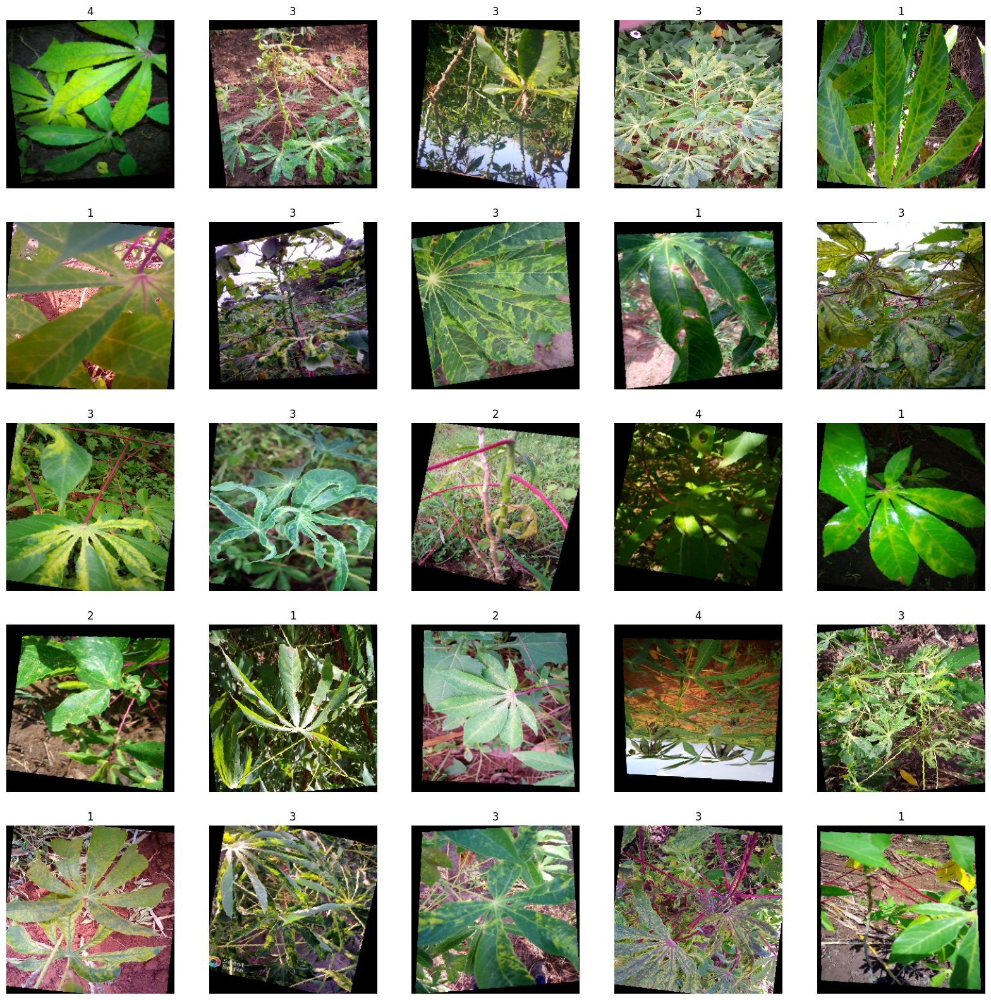

In [29]:
nc, nr = 5, 5
fig, ax = plt.subplots(nr, nc, figsize=(20, 20))
k = 0
for i in range(nc):
    for j in range(nr):
        x, y = train_dataset[k]
        ax[i][j].imshow(to_pil_image(x))
        ax[i][j].set_title(y.squeeze().argmax().item())
        ax[i][j].axis('off')
        k += 1
plt.show()

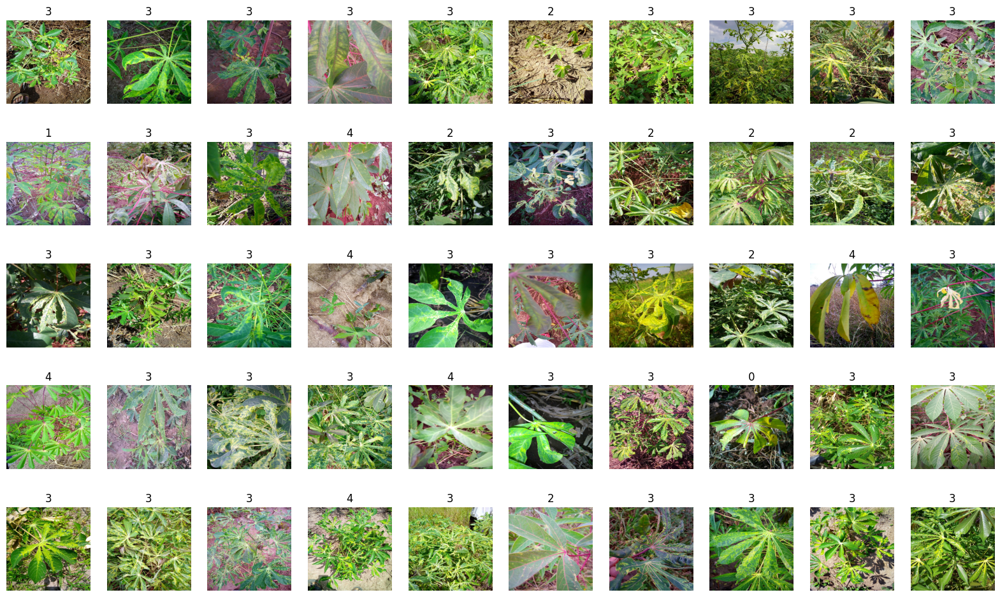

In [30]:
fig, ax = plt.subplots(5, 10, figsize=(20, 12))
k = 0
for i in range(5):
    for j in range(10):
        x, y = test_dataset[k]
        ax[i][j].imshow(to_pil_image(x))
        ax[i][j].set_title(y.squeeze().argmax().item())
        ax[i][j].axis('off')
        k += 1
plt.show()

# Задание 1 Опция 1 CNN классификация изображения

Обучить CNN  для классификации на данных «Cassava Leaf Disease Classification» (https://www.kaggle.com/competitions/cassava-leaf-disease-classification)
1. Обучить свою модель CNN:

  1. Создать свою модель CNN (с или без Dropout и Batch Normalization)
  2. Обучить с использованием разных оптимизаторов (SGD Momentum, RMSProp, Adam) с и без learning rate scheduler
  3. С и без использованием аугментации изображений
2. Отобразить результаты всех экспериментов в одной таблице(пример дальше) и графики обучения
3. Отобразить активации внутренних слоев сети или сделать визуализацию фильтров https://blog.keras.io/how-convolutional-neural-networks-see-the-world.html
4. Transfer Learning: Использовать предобученную модель на ImageNet (ResNet, VGG, GoogLeNet и т д) с заменой слоя классификации на слой с нужным количеством классов и обучить модель на данном датасете
5. Сравнить результаты



## My CNN

### Sup layers

In [13]:
class LastActivationSaver(NN.Module):
    def __init__(self, model):
        super(LastActivationSaver, self).__init__()
        self.model = model
        self.last_activation = None
        
    def to(self, d):
        self.model = self.model.to(d)
        return self
    
    def forward(self, x: torch.Tensor):
        output = self.model(x)
        self.last_activation = output.detach().to('cpu').clone()
        return output


class ParallelConv(NN.Module):
    def __init__(self, *args, cat_dim: int):
        super(ParallelConv, self).__init__()
        self.modules = args
        self.cat_dim = cat_dim
        
    def to(self, d):
        self.modules = [i.to(d) for i in self.modules]
        return self
    
    def forward(self, x: torch.Tensor):
        outputs = []
        for i in self.modules:
            outputs.append(i(x))
        return torch.cat(outputs, dim=self.cat_dim)


class ConvLayersBridge(NN.Module):
    def __init__(self, in_channels: int, out_channels: int, pooling_scale: Tuple[int]):
        '''
            B, C, H, W
        '''
        super(ConvLayersBridge, self).__init__()
        self.model = NN.Sequential(
            NN.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=1),
            NN.MaxPool2d((pooling_scale[0], pooling_scale[1]))
        )
        
    def to(self, d):
        self.model = self.model.to(d)
        return self
    
    def forward(self, x: torch.Tensor):
        output = self.model(x)
        return output


In [14]:
class EncoderParallelConvLayer(NN.Module):
    def __init__(
        self, 
        in_channels: int, 
        out_channels_list: List[int], 
        kernel_sizes: List[int], 
        padding: List[int], 
        dilations: List[int],
        pooling_scale: Tuple[int],
    ):
        super(EncoderParallelConvLayer, self).__init__()
        self.model=NN.Sequential(
            ParallelConv(
                *[
                    NN.Conv2d(in_channels=in_channels, out_channels=oc, kernel_size=ks, padding=p, dilation=d)
                    for oc, ks, p, d in zip(out_channels_list, kernel_sizes, padding, dilations)
                ],
                cat_dim=1
            ),
            NN.AvgPool2d((
                pooling_scale[0], pooling_scale[1]
            )),
        )
        
    def to(self, d):
#         print('EncoderParallelConvLayer')
        k = 0
        for i in self.model:
            self.model[k] = i.to(d)
            k+=1
        return self
    
    def forward(self, x: torch.Tensor):
        output = self.model(x)
        return output


class EncoderCommonConvLayer(NN.Module):
    def __init__(self,in_channels:int, out_channels:int):
        super(EncoderCommonConvLayer, self).__init__()
        self.model = NN.Sequential(
            NN.Conv2d(
                in_channels=in_channels,
                out_channels=out_channels,
                kernel_size=3,
                padding=1
            ),
            NN.Conv2d(
                in_channels=in_channels,
                out_channels=out_channels,
                kernel_size=1,
            ),
        )
        
    def to(self, d):
#         print('EncoderCommonConvLayer')
        self.model = self.model.to(d)
        return self
    
    def forward(self, x: torch.Tensor):
        output = self.model(x)
        return output
    
    
class EncoderCombinedConvLayer(NN.Module):
    def __init__(
        self,
        in_channels: int, 
        out_channels_list: List[int], 
        kernel_sizes: List[int], 
        padding: List[int], 
        dilations: List[int],
        pooling_scale: Tuple[int]
    ):
        super(EncoderCombinedConvLayer, self).__init__()
        self.conv_parallel = EncoderParallelConvLayer(
            in_channels=in_channels, 
            out_channels_list=out_channels_list, 
            kernel_sizes=kernel_sizes, 
            padding=padding, 
            dilations=dilations,
            pooling_scale=pooling_scale
        )
        self.conv_linear = EncoderCommonConvLayer(in_channels=sum(out_channels_list), out_channels=sum(out_channels_list))
    
    def to(self, d):
        self.conv_parallel = self.conv_parallel.to(d)
        self.conv_linear = self.conv_linear.to(d)
        return self
    
    def forward(self, x: torch.Tensor):
        x = self.conv_parallel(x)
        output = self.conv_linear(x)
        return output

Tests

In [ ]:
model = ConvLayersBridge(in_channels=3, out_channels=3, pooling_scale=(2, 2), )
batch = torch.randn(4,3,340,340)
y = model(batch)
print(y.shape)
plt.figure(figsize= (5, 6))
plt.axis('off')
make_dot(y, params=dict(list(model.named_parameters()))).render("model", format="png")
plt.imshow(Image.open('/kaggle/working/model.png'))

In [ ]:
model = ParallelConv(
    NN.Conv2d(in_channels=3, out_channels=4, kernel_size=3, padding=1, dilation=1),
    NN.Conv2d(in_channels=3, out_channels=4, kernel_size=3, padding=2, dilation=2),
    NN.Conv2d(in_channels=3, out_channels=4, kernel_size=3, padding=3, dilation=3),
    NN.Conv2d(in_channels=3, out_channels=4, kernel_size=3, padding=4, dilation=4),
    cat_dim=1
)
batch = torch.randn(4,3,340,340)
y = model(batch)
print(y.shape)
plt.figure(figsize= (20, 10))
plt.axis('off')
make_dot(y, params=dict(list(model.named_parameters()))).render("model", format="png")
plt.imshow(Image.open('/kaggle/working/model.png'))

In [ ]:
model = EncoderParallelConvLayer(
    in_channels=3, 
    out_channels_list=[4, 4, 4, 4], 
    kernel_sizes=[3, 3, 3,3 ], 
    padding=[1, 2, 3, 4], 
    dilations=[1, 2, 3, 4],
    pooling_scale=(2, 2)
)
batch = torch.randn(4,3,340,340)
y = model(batch)
print(y.shape)
plt.figure(figsize= (20, 10))
plt.axis('off')
make_dot(y, params=dict(list(model.named_parameters()))).render("model", format="png")
plt.imshow(Image.open('/kaggle/working/model.png'))

In [ ]:
model = EncoderCommonConvLayer(in_channels=3, out_channels=3)
batch = torch.randn(4,3,340,340)
y = model(batch)
print(y.shape)
plt.figure(figsize= (10, 5))
plt.axis('off')
make_dot(y, params=dict(list(model.named_parameters()))).render("model", format="png")
plt.imshow(Image.open('/kaggle/working/model.png'))

In [ ]:
model = EncoderCombinedConvLayer(
    in_channels=3, 
    out_channels_list=[4, 4, 4, 4], 
    kernel_sizes=[3, 3, 3,3 ], 
    padding=[1, 2, 3, 4], 
    dilations=[1, 2, 3, 4],
    pooling_scale=(2, 2)
)
batch = torch.randn(4,3,340,340)
y = model(batch)
print(y.shape)
plt.figure(figsize= (40, 20))
plt.axis('off')
make_dot(y, params=dict(list(model.named_parameters()))).render("model", format="png")
plt.imshow(Image.open('/kaggle/working/model.png'))

### Main model parts

In [15]:
class InputProcessor(NN.Module):
    def __init__(self):
        super(InputProcessor, self).__init__()
        self.model = NN.Sequential(
            NN.LayerNorm(normalized_shape=(Parameters.image_n_chanels, Parameters.image_height, Parameters.image_width)),
            NN.BatchNorm2d(3),
            NN.Conv2d(
                in_channels = Parameters.image_n_chanels, 
                out_channels=Parameters.image_n_chanels, 
                kernel_size=3,
                padding=1
            ),
            NN.Conv2d(
                in_channels = Parameters.image_n_chanels, 
                out_channels=Parameters.image_n_chanels, 
                kernel_size=1
            )
        )
        
        
    def to(self, d):
        self.model = self.model.to(d)
        return self
    
    
    def forward(self, x: torch.Tensor):
        output = self.model(x)
        return output
        

In [16]:
class Encoder(NN.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        self.first_layer = LastActivationSaver(model=EncoderCombinedConvLayer(
            in_channels=3, 
            out_channels_list=[2, 2, 2, 2], 
            kernel_sizes=[3, 3, 3,3 ], 
            padding=[1, 2, 2, 1], 
            dilations=[1, 2, 2, 1],
            pooling_scale=(2, 2)
        ))
        self.second_layer = LastActivationSaver(model=EncoderCombinedConvLayer(
            in_channels=8, 
            out_channels_list=[4, 4, 4, 4], 
            kernel_sizes=[3, 3, 3, 3], 
            padding=[1, 2, 2, 1], 
            dilations=[1, 2, 2, 1],
            pooling_scale=(2, 2)
        ))
        
        self.third_layer = LastActivationSaver(model=EncoderCombinedConvLayer(
            in_channels=16, 
            out_channels_list=[16, 16, 16, 16], 
            kernel_sizes=[3, 3, 3, 3], 
            padding=[1, 2, 2, 1], 
            dilations=[1, 2, 2, 1],
            pooling_scale=(2, 2)
        ))
        self.fourth_layer = LastActivationSaver(model=EncoderCombinedConvLayer(
            in_channels=64, 
            out_channels_list=[32, 32, 32, 32], 
            kernel_sizes=[3, 3, 3, 3], 
            padding=[1, 2, 2, 1], 
            dilations=[1, 2, 2, 1],
            pooling_scale=(2, 2)
        ))
        self.fiveth_layer = LastActivationSaver(model=EncoderCombinedConvLayer(
            in_channels=128, 
            out_channels_list=[64, 64, 64, 64], 
            kernel_sizes=[3, 3, 3, 3], 
            padding=[1, 2, 2, 1], 
            dilations=[1, 2, 2, 1],
            pooling_scale=(2, 2)
        ))
#         self.sixth_layer = EncoderCombinedConvLayer(
#             in_channels=256, 
#             out_channels_list=[128, 128, 128, 128], 
#             kernel_sizes=[3, 3, 3, 3], 
#             padding=[1, 2, 2, 1], 
#             dilations=[1, 2, 2, 1],
#             pooling_scale=(2, 2)
#         )
#         self.seventh_parallel_layer = LastActivationSaver(model=EncoderCombinedConvLayer(
#             in_channels=512, 
#             out_channels_list=[256, 256, 256, 256], 
#             kernel_sizes=[3, 3, 3, 3], 
#             padding=[1, 2, 2, 1], 
#             dilations=[1, 2, 2, 1],
#             pooling_scale=(2, 2)
#         ))
#         self.bridge_3_7 = ConvLayersBridge(in_channels=64, out_channels=1024, pooling_scale=(16, 16))
        
    def to(self, d):
        self.first_layer = self.first_layer.to(d)
        self.second_layer = self.second_layer.to(d)
        self.third_layer = self.third_layer.to(d)
        self.fourth_layer = self.fourth_layer.to(d)
        self.fiveth_layer = self.fiveth_layer.to(d)
#         self.sixth_layer = self.sixth_layer.to(d)
#         self.seventh_parallel_layer = self.seventh_parallel_layer.to(d)
#         self.bridge_3_7 = self.bridge_3_7.to(d)
        return self
    
    def forward(self, x: torch.Tensor, p=0.1):
#         print('e0')
        x1 = self.first_layer(x)
        x1 = F.tanh(x1)
        x1 = NN.Dropout2d(p)(x1)
#         print('e1')
        x2 = self.second_layer(x1)
        x2 = F.tanh(x2)
#         print('e2')
        x3 = self.third_layer(x2)
        x3 = F.tanh(x3)
#         print('e3')
#         x_3_7 = self.bridge_3_7(x3)
        x4 = self.fourth_layer(x3)
        x4 = F.tanh(x4)
        x4 = NN.Dropout2d(p)(x4)
        x5 = self.fiveth_layer(x4)
        x5 = F.tanh(x5)
        return x5
#         x6 = self.sixth_layer(x5)
#         x6 = F.tanh(x6)
#         x6 = NN.Dropout2d(p)(x6)
#         x7 = self.seventh_parallel_layer(x6)
# #         print(x7.shape, x_3_7.shape)
# #         x7 = x7 + x_3_7
#         x7 = F.tanh(x7)
#         return x7
    

In [17]:
class EncoderDecoderAdapter(NN.Module):
    def __init__(self):
        super(EncoderDecoderAdapter, self).__init__()
        self.model = NN.Sequential(
            NN.Conv2d(in_channels=256, out_channels=256, kernel_size=1),
            NN.AvgPool2d((2, 2)),
            NN.Conv2d(in_channels=256, out_channels=256, kernel_size=1),
            NN.AvgPool2d((2, 2)),
            NN.Conv2d(in_channels=256, out_channels=256, kernel_size=1),
            NN.AvgPool2d((2, 2)),
            NN.ELU(),
        )
        self.device = 'cpu'
    def to(self, d):
        self.model = self.model.to(d)
        self.device = d
        return self
    
    def forward(self, x: torch.Tensor):
        x1 = self.model(x.to(self.device))
        return x1

In [18]:
class Decoder(NN.Module):
    def __init__(self):
        super(Decoder, self).__init__()
        self.model = NN.Sequential(
            NN.Linear(256, 512),
            NN.Linear(512, 256),
            NN.ELU(),
            NN.Linear(256, 128),
            NN.Linear(128, 64),
            NN.ELU(),
            NN.Linear(64, 32),
            NN.Linear(32, Parameters.n_classes),
            NN.Softmax(dim=1)
        )
    def to(self, d):
        self.model = self.model.to(d)
        return self
    def forward(self, x: torch.Tensor):
        x1 = self.model(x)
        return x1

Test

In [66]:
model = Encoder()
batch = torch.randn(4,3,256,256)
y = model(batch)
print(y.shape)

torch.Size([4, 256, 8, 8])


### Main Model

In [19]:
class MyModel(NN.Module):
    def __init__(self, input_processor_layer, encoder, encoder_decoder_adapter, decoder):
        super(MyModel, self).__init__()
        self.input_processor_layer = input_processor_layer
        self.encoder = encoder
        self.encoder_decoder_adapter = encoder_decoder_adapter
        self.decoder = decoder
    
    def to(self, d):
        self.input_processor_layer = self.input_processor_layer.to(d)
        self.encoder = self.encoder.to(d)
        self.encoder_decoder_adapter = self.encoder_decoder_adapter.to(d)
        self.decoder = self.decoder.to(d)
        return self

    def forward(self, x: torch.Tensor):
#         print(x.shape)
        x_processed = self.input_processor_layer(x)
#         print(x_processed.shape)
        x_encoded = self.encoder(x_processed)
#         print('m', x_encoded.shape)
        x_decoder_adapted = self.encoder_decoder_adapter(x_encoded).squeeze(2).squeeze(2)
        output = self.decoder(x_decoder_adapted)
        return output

e0
e1
e2
e3
torch.Size([4, 5])


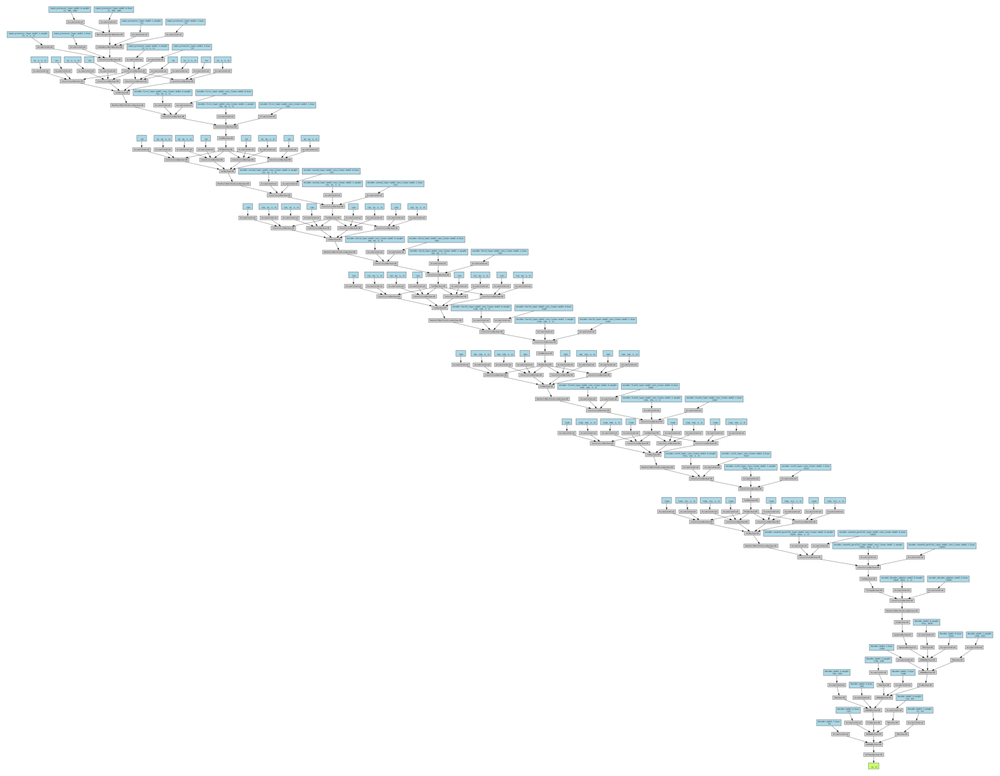

In [58]:
# input_processor = torch.nn.DataParallel(InputProcessor(), device_ids=[0, 1]).to(0)
# encoder = torch.nn.DataParallel(Encoder(), device_ids=[0, 1]).to(0)
# encoder_decoder_adapter = torch.nn.DataParallel(EncoderDecoderAdapter(), device_ids=[0, 1]).to(0)
# decoder = torch.nn.DataParallel(Decoder(), device_ids=[0, 1]).to(0)
input_processor = InputProcessor().to(1)
encoder = Encoder().to(1)
encoder_decoder_adapter = EncoderDecoderAdapter().to(0)
decoder = Decoder().to(0)
model = MyModel(
    input_processor_layer = input_processor,
    encoder = encoder,
    encoder_decoder_adapter = encoder_decoder_adapter,
    decoder = decoder,
)
batch = torch.randn(4,3,340,340)
y = model(batch.to(1))
print(y.shape)
plt.figure(figsize= (20, 40))
plt.axis('off')
make_dot(y, params=dict(list(model.named_parameters()))).render("model", format="png")
plt.imshow(Image.open('/kaggle/working/model.png'))

In [62]:
# input_processor = torch.nn.DataParallel(InputProcessor(), device_ids=[0, 1]).to(0)
# encoder = torch.nn.DataParallel(Encoder(), device_ids=[0, 1]).to(0)
# encoder_decoder_adapter = torch.nn.DataParallel(EncoderDecoderAdapter(), device_ids=[0, 1]).to(0)
# decoder = torch.nn.DataParallel(Decoder(), device_ids=[0, 1]).to(0)

# model = MyModel(
#     input_processor_layer = input_processor,
#     encoder = encoder,
#     encoder_decoder_adapter = encoder_decoder_adapter,
#     decoder = decoder,
# )
# batch = torch.randn(4,3,340,340)
# y = model(batch.to(1))
# print(y.shape)
# # plt.figure(figsize= (20, 40))
# # plt.axis('off')
# # make_dot(y, params=dict(list(model.named_parameters()))).render("model", format="png")
# # plt.imshow(Image.open('/kaggle/working/model.png'))

e0e0



RuntimeError: Caught RuntimeError in replica 0 on device 0.
Original Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/torch/nn/parallel/parallel_apply.py", line 85, in _worker
    output = module(*input, **kwargs)
  File "/opt/conda/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1518, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
  File "/opt/conda/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1527, in _call_impl
    return forward_call(*args, **kwargs)
  File "/tmp/ipykernel_34/2407890830.py", line 76, in forward
    x1 = self.first_layer(x)
  File "/opt/conda/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1518, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
  File "/opt/conda/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1527, in _call_impl
    return forward_call(*args, **kwargs)
  File "/tmp/ipykernel_34/3259492027.py", line 12, in forward
    output = self.model(x)
  File "/opt/conda/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1518, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
  File "/opt/conda/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1527, in _call_impl
    return forward_call(*args, **kwargs)
  File "/tmp/ipykernel_34/2645556448.py", line 92, in forward
    x = self.conv_parallel(x)
  File "/opt/conda/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1518, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
  File "/opt/conda/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1527, in _call_impl
    return forward_call(*args, **kwargs)
  File "/tmp/ipykernel_34/2645556448.py", line 34, in forward
    output = self.model(x)
  File "/opt/conda/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1518, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
  File "/opt/conda/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1527, in _call_impl
    return forward_call(*args, **kwargs)
  File "/opt/conda/lib/python3.10/site-packages/torch/nn/modules/container.py", line 215, in forward
    input = module(input)
  File "/opt/conda/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1518, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
  File "/opt/conda/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1527, in _call_impl
    return forward_call(*args, **kwargs)
  File "/tmp/ipykernel_34/3259492027.py", line 30, in forward
    outputs.append(i(x))
  File "/opt/conda/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1518, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
  File "/opt/conda/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1527, in _call_impl
    return forward_call(*args, **kwargs)
  File "/opt/conda/lib/python3.10/site-packages/torch/nn/modules/conv.py", line 460, in forward
    return self._conv_forward(input, self.weight, self.bias)
  File "/opt/conda/lib/python3.10/site-packages/torch/nn/modules/conv.py", line 456, in _conv_forward
    return F.conv2d(input, weight, bias, self.stride,
RuntimeError: Input type (torch.cuda.FloatTensor) and weight type (torch.FloatTensor) should be the same


## My CNN + Aug

In [20]:
input_processor = InputProcessor().to(1)
encoder = Encoder().to(1)
encoder_decoder_adapter = EncoderDecoderAdapter().to(0)
decoder = Decoder().to(0)
net = MyModel(
    input_processor_layer = input_processor,
    encoder = encoder,
    encoder_decoder_adapter = encoder_decoder_adapter,
    decoder = decoder,
)
# net = MyModel()
# net = net.to(0)
# net = torch.nn.DataParallel(net, device_ids=[0, 1])
# net = net.to(0)
x, y = train_dataset[0]
net(x.float().unsqueeze(0).to(1)).shape

torch.Size([1, 5])

In [28]:
criterion = NN.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=0.0001)

In [29]:
train_process = TrainResults('transfom')

In [30]:
loss_m = []
valid_loss_mean = []
valid_loss = []

In [31]:
n_of_batches = 0
for e in tqdm(range(Parameters.epochs)):
  int_loss_m = []
  k = 0
  for xb, yb in train_dataloader:
    n_of_batches += 1
    outputs = net(xb.float().to(1))
    loss = criterion(outputs.to(0), yb.float().to(0))
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    loss_m.append(loss.item())
    train_process.train_losses.append(loss.item())
    int_loss_m.append(loss.item())
    if k > 50:
        break
    k += 1
  if e % 10 == 0:
    with torch.no_grad():
        g = []
        for xb, yb in test_dataloader:
            outputs = net(xb.float().to(1))
            loss = criterion(outputs.to(0), yb.float().to(0))
            g.append(loss.item())
            train_process.test_losses.append(loss.item())
        valid_loss_mean.append(np.mean(g))
        valid_loss += g
    print(e, 'avg_loss=', np.mean(loss_m), 'last_loss = ', loss.item(), 'min_loss = ', np.min(loss_m))
    print(e, 'int_loss_m__mean = ', np.mean(int_loss_m), 'int_loss_m__min = ', np.min(int_loss_m))
    print(e, 'int_loss_m__mean = ', np.mean(valid_loss), 'int_loss_m__min = ', np.min(valid_loss))
print('END', 'avg_loss=', np.mean(loss_m), 'last_loss = ', loss.item(), 'min_loss = ', np.min(loss_m))
save_train_res(net, train_process)

  0%|          | 1/300 [01:53<9:26:37, 113.70s/it]

0 avg_loss= 0.11663152869133388 last_loss =  0.12083247303962708 min_loss =  0.10804221779108047
0 int_loss_m__mean =  0.11663152869133388 int_loss_m__min =  0.10804221779108047
0 int_loss_m__mean =  0.1167005408141348 int_loss_m__min =  0.11295508593320847


  4%|▎         | 11/300 [18:54<8:25:18, 104.91s/it]

10 avg_loss= 0.11546908532154751 last_loss =  0.11704865843057632 min_loss =  0.10091717541217804
10 int_loss_m__mean =  0.11460278752972097 int_loss_m__min =  0.10286632925271988
10 int_loss_m__mean =  0.11547594972782665 int_loss_m__min =  0.10631324350833893


  7%|▋         | 21/300 [35:58<8:08:18, 105.01s/it]

20 avg_loss= 0.11500036611067814 last_loss =  0.11223777383565903 min_loss =  0.10091717541217804
20 int_loss_m__mean =  0.11445836372235242 int_loss_m__min =  0.1032506451010704
20 int_loss_m__mean =  0.11491090914717426 int_loss_m__min =  0.10631324350833893


 10%|█         | 31/300 [53:00<7:49:34, 104.74s/it]

30 avg_loss= 0.11472979773267171 last_loss =  0.11009936779737473 min_loss =  0.10091717541217804
30 int_loss_m__mean =  0.11438207218752187 int_loss_m__min =  0.10333575308322906
30 int_loss_m__mean =  0.1145822008450826 int_loss_m__min =  0.10631324350833893


 14%|█▎        | 41/300 [1:10:01<7:33:05, 104.96s/it]

40 avg_loss= 0.11448300060638396 last_loss =  0.1208028718829155 min_loss =  0.10033074766397476
40 int_loss_m__mean =  0.11317803907920332 int_loss_m__min =  0.10319321602582932
40 int_loss_m__mean =  0.11429232541057799 int_loss_m__min =  0.10436773300170898


 17%|█▋        | 51/300 [1:27:03<7:15:46, 105.01s/it]

50 avg_loss= 0.11377823011221358 last_loss =  0.11433325707912445 min_loss =  0.0954551100730896
50 int_loss_m__mean =  0.10935453807606417 int_loss_m__min =  0.10000542551279068
50 int_loss_m__mean =  0.11347057366812671 int_loss_m__min =  0.10221047699451447


 20%|██        | 61/300 [1:44:07<6:58:10, 104.98s/it]

60 avg_loss= 0.11291828841732576 last_loss =  0.10430137813091278 min_loss =  0.0954551100730896
60 int_loss_m__mean =  0.1075390781111577 int_loss_m__min =  0.09985999017953873
60 int_loss_m__mean =  0.11263463598868204 int_loss_m__min =  0.10221047699451447


 24%|██▎       | 71/300 [2:01:11<6:41:28, 105.19s/it]

70 avg_loss= 0.11208260034665453 last_loss =  0.10270527750253677 min_loss =  0.09220104664564133
70 int_loss_m__mean =  0.10618053902597989 int_loss_m__min =  0.09615104645490646
70 int_loss_m__mean =  0.11179989679820007 int_loss_m__min =  0.101106658577919


 27%|██▋       | 81/300 [2:18:14<6:23:11, 104.99s/it]

80 avg_loss= 0.11131359996056332 last_loss =  0.1003054603934288 min_loss =  0.09220104664564133
80 int_loss_m__mean =  0.10534966452156797 int_loss_m__min =  0.09549278765916824
80 int_loss_m__mean =  0.1111152356053576 int_loss_m__min =  0.1001695916056633


 30%|███       | 91/300 [2:35:17<6:05:09, 104.83s/it]

90 avg_loss= 0.11060246493144812 last_loss =  0.09391538798809052 min_loss =  0.09220104664564133
90 int_loss_m__mean =  0.10427109239732518 int_loss_m__min =  0.09668836742639542
90 int_loss_m__mean =  0.11038763117459086 int_loss_m__min =  0.09391538798809052


 34%|███▎      | 101/300 [2:52:21<5:49:15, 105.30s/it]

100 avg_loss= 0.10995088870017142 last_loss =  0.11453158408403397 min_loss =  0.086868517100811
100 int_loss_m__mean =  0.10403595229282099 int_loss_m__min =  0.09145957231521606
100 int_loss_m__mean =  0.10983474868716615 int_loss_m__min =  0.09391538798809052


 37%|███▋      | 111/300 [3:09:25<5:31:18, 105.18s/it]

110 avg_loss= 0.10933145937753154 last_loss =  0.09735456109046936 min_loss =  0.086868517100811
110 int_loss_m__mean =  0.10259416348793927 int_loss_m__min =  0.09542091935873032
110 int_loss_m__mean =  0.10922725533169729 int_loss_m__min =  0.09391538798809052


 40%|████      | 121/300 [3:26:30<5:13:36, 105.12s/it]

120 avg_loss= 0.108710692446601 last_loss =  0.09791385382413864 min_loss =  0.086868517100811
120 int_loss_m__mean =  0.10130818012882681 int_loss_m__min =  0.0943761020898819
120 int_loss_m__mean =  0.10863396136933921 int_loss_m__min =  0.09162744134664536


 44%|████▎     | 131/300 [3:43:34<4:55:58, 105.08s/it]

130 avg_loss= 0.1080747222102138 last_loss =  0.0972677543759346 min_loss =  0.086868517100811
130 int_loss_m__mean =  0.09943296059089549 int_loss_m__min =  0.0891072079539299
130 int_loss_m__mean =  0.10803545851792608 int_loss_m__min =  0.09162744134664536


 47%|████▋     | 141/300 [4:00:40<4:39:38, 105.52s/it]

140 avg_loss= 0.10742725905156851 last_loss =  0.10101988911628723 min_loss =  0.0849585086107254
140 int_loss_m__mean =  0.09855536634431165 int_loss_m__min =  0.08955522626638412
140 int_loss_m__mean =  0.1074673013554679 int_loss_m__min =  0.09162744134664536


 50%|█████     | 151/300 [4:17:45<4:20:33, 104.92s/it]

150 avg_loss= 0.10676527936425151 last_loss =  0.08766462653875351 min_loss =  0.0849585086107254
150 int_loss_m__mean =  0.09666694634977509 int_loss_m__min =  0.08688094466924667
150 int_loss_m__mean =  0.10677803752736913 int_loss_m__min =  0.08766462653875351


 54%|█████▎    | 161/300 [4:34:51<4:03:42, 105.20s/it]

160 avg_loss= 0.10610489593529553 last_loss =  0.08938659727573395 min_loss =  0.0849585086107254
160 int_loss_m__mean =  0.0959326033206547 int_loss_m__min =  0.08575423806905746
160 int_loss_m__mean =  0.10620775161420598 int_loss_m__min =  0.08766462653875351


 57%|█████▋    | 171/300 [4:51:55<3:46:07, 105.18s/it]

170 avg_loss= 0.10550231171056172 last_loss =  0.10861237347126007 min_loss =  0.08046272397041321
170 int_loss_m__mean =  0.09532227739691734 int_loss_m__min =  0.08575501292943954
170 int_loss_m__mean =  0.10571667970514592 int_loss_m__min =  0.08739682286977768


 60%|██████    | 181/300 [5:08:59<3:27:57, 104.85s/it]

180 avg_loss= 0.10493506023010768 last_loss =  0.0956185832619667 min_loss =  0.08046272397041321
180 int_loss_m__mean =  0.0950284155414385 int_loss_m__min =  0.08667421340942383
180 int_loss_m__mean =  0.10516141599033312 int_loss_m__min =  0.08739682286977768


 64%|██████▎   | 191/300 [5:26:05<3:11:33, 105.44s/it]

190 avg_loss= 0.10440619176521572 last_loss =  0.09013762325048447 min_loss =  0.08046272397041321
190 int_loss_m__mean =  0.09471437663716428 int_loss_m__min =  0.08608845621347427
190 int_loss_m__mean =  0.10467924239734809 int_loss_m__min =  0.08739682286977768


 67%|██████▋   | 201/300 [5:43:12<2:53:25, 105.11s/it]

200 avg_loss= 0.10391780095518874 last_loss =  0.09670401364564896 min_loss =  0.08046272397041321
200 int_loss_m__mean =  0.09447823399130036 int_loss_m__min =  0.0858750119805336
200 int_loss_m__mean =  0.1042465962587841 int_loss_m__min =  0.08739682286977768


 70%|███████   | 211/300 [6:00:15<2:35:43, 104.98s/it]

210 avg_loss= 0.1034642439860054 last_loss =  0.10067084431648254 min_loss =  0.07955938577651978
210 int_loss_m__mean =  0.09414289935546763 int_loss_m__min =  0.07955938577651978
210 int_loss_m__mean =  0.10385036976499991 int_loss_m__min =  0.08739682286977768


 74%|███████▎  | 221/300 [6:17:19<2:18:35, 105.26s/it]

220 avg_loss= 0.10303127245483229 last_loss =  0.08938116580247879 min_loss =  0.07955938577651978
220 int_loss_m__mean =  0.09376689353409935 int_loss_m__min =  0.08582713454961777
220 int_loss_m__mean =  0.103479095739155 int_loss_m__min =  0.08739682286977768


 77%|███████▋  | 231/300 [6:34:24<2:01:00, 105.23s/it]

230 avg_loss= 0.10263464173815741 last_loss =  0.08842692524194717 min_loss =  0.07955938577651978
230 int_loss_m__mean =  0.09372979775071144 int_loss_m__min =  0.08410808444023132
230 int_loss_m__mean =  0.10315719215820233 int_loss_m__min =  0.08739682286977768


 77%|███████▋  | 232/300 [6:37:08<1:56:24, 102.71s/it]


KeyboardInterrupt: 

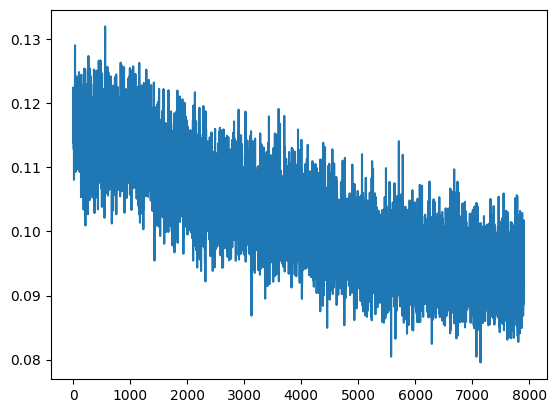

In [32]:
plt.plot(loss_m)

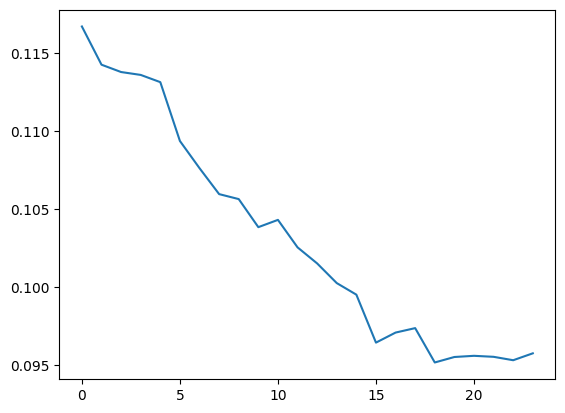

In [33]:
plt.plot(valid_loss_mean)

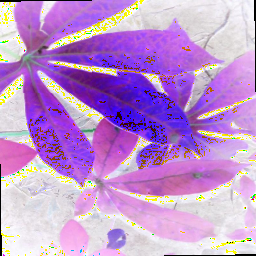

In [34]:
net(x.float().unsqueeze(0).to(1))
to_pil_image(x.float())

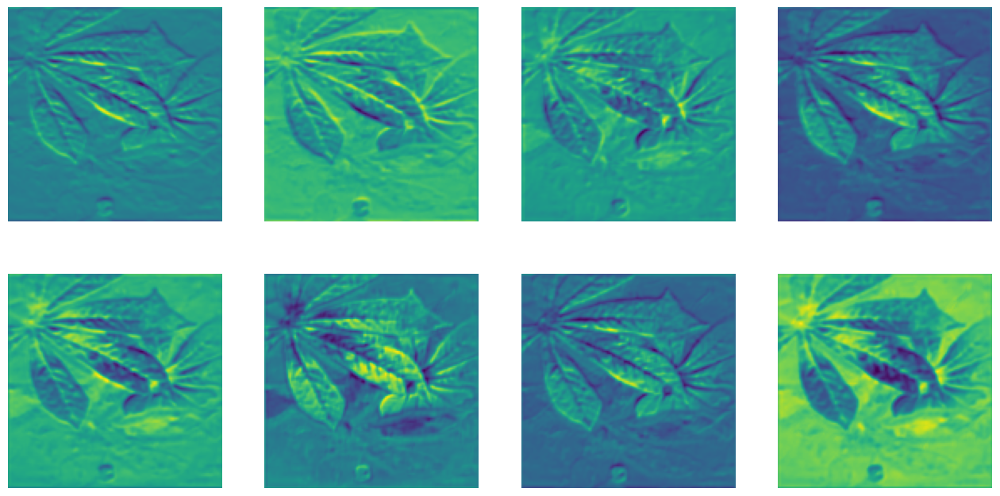

In [35]:
nc, nr = 2, 4
f, a = plt.subplots(nc, nr, figsize=(16, 8))
k = net.encoder.first_layer.last_activation.to('cpu')[0]
for i in range(len(k)):
    a[i//nr, i%nr].imshow(k[i])
    a[i//nr, i%nr].axis('off')

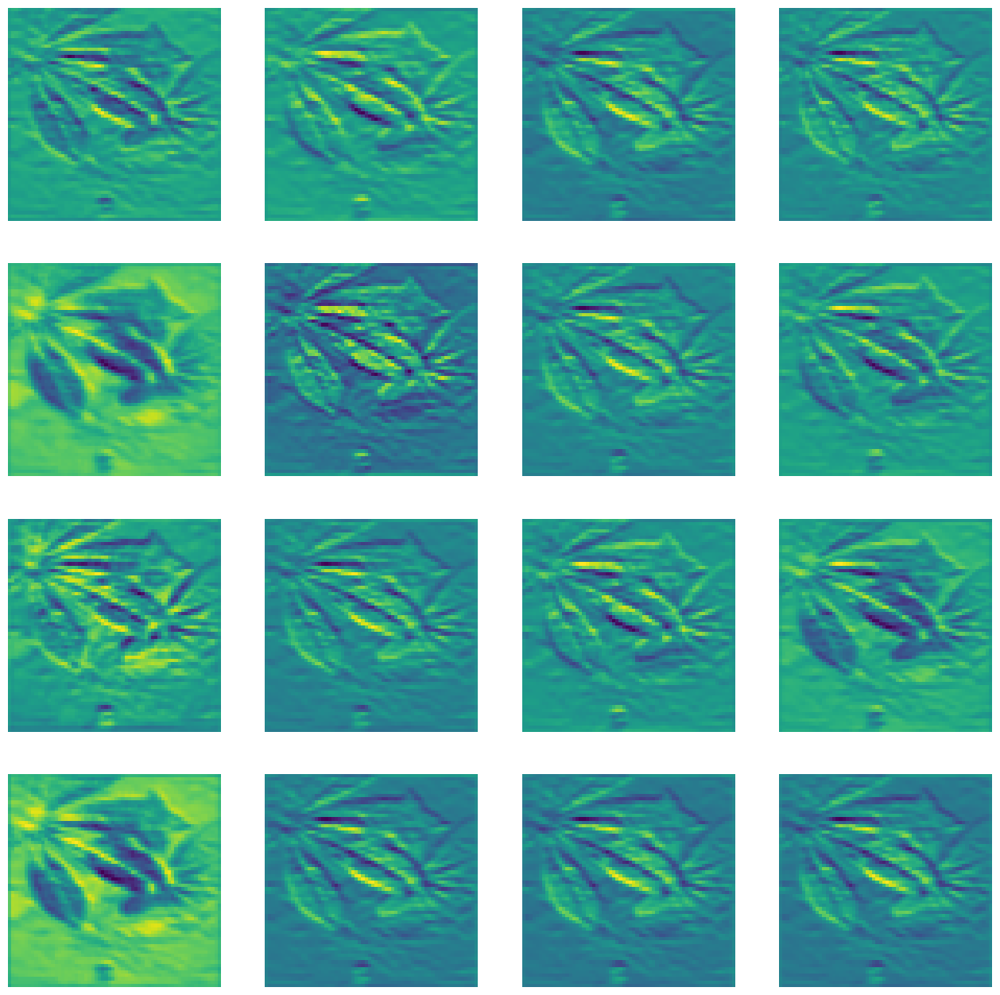

In [36]:
nc, nr = 4, 4
f, a = plt.subplots(nc, nr, figsize=(16, 16))
k = net.encoder.second_layer.last_activation[0]
for i in range(len(k)):
    a[i//nr, i%nr].imshow(k[i])
    a[i//nr, i%nr].axis('off')

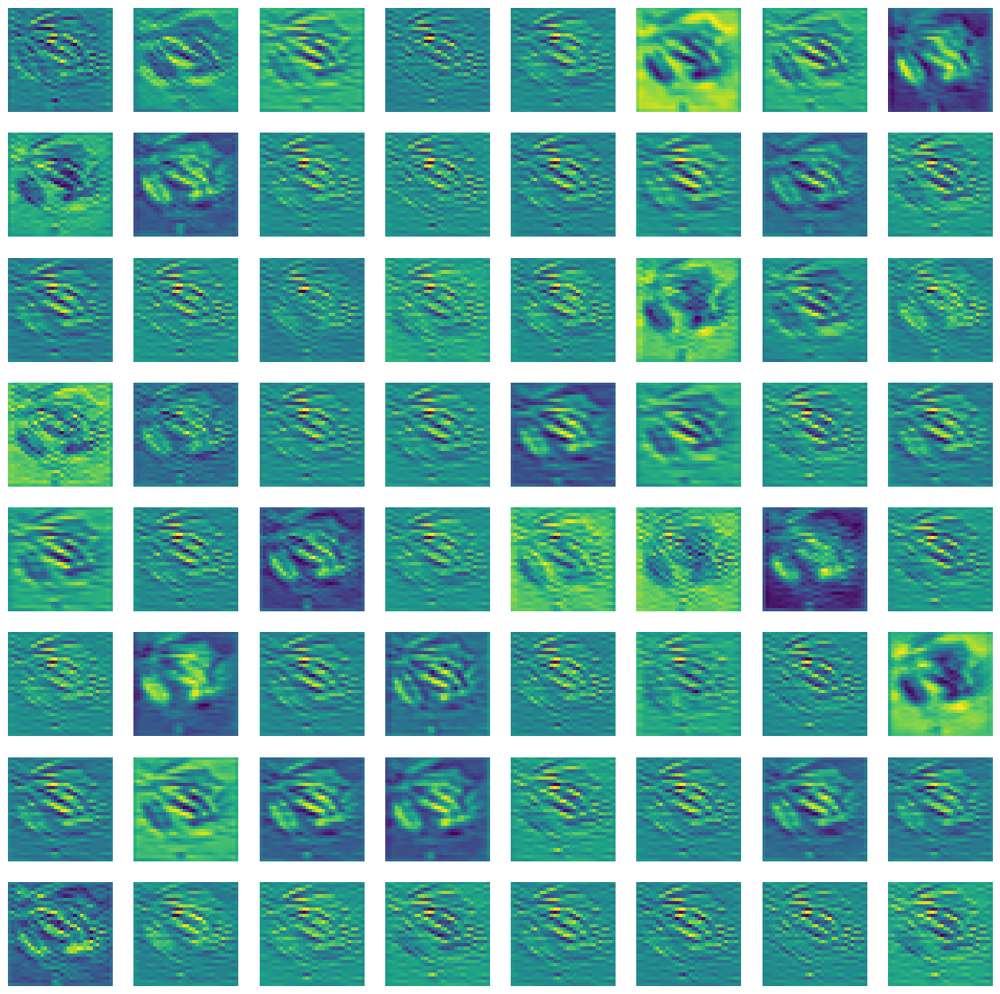

In [37]:
nc, nr = 8, 8
f, a = plt.subplots(nc, nr, figsize=(16, 16))
k = net.encoder.third_layer.last_activation[0]
# len(k)
for i in range(len(k)):
    a[i//nr, i%nr].imshow(k[i])
    a[i//nr, i%nr].axis('off')

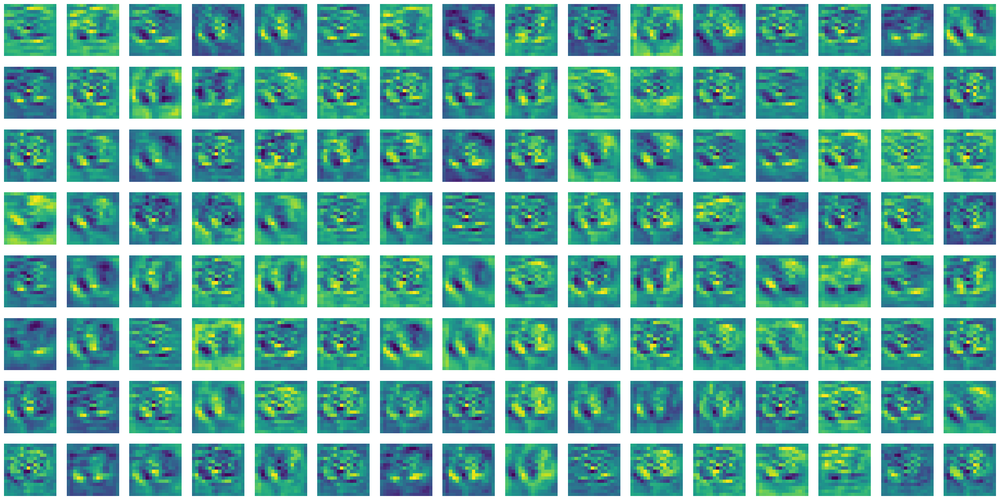

In [38]:
nc, nr = 8, 16
f, a = plt.subplots(nc, nr, figsize=(32, 16))
k = net.encoder.fourth_layer.last_activation[0]
# len(k)
for i in range(len(k)):
    a[i//nr, i%nr].imshow(k[i])
    a[i//nr, i%nr].axis('off')

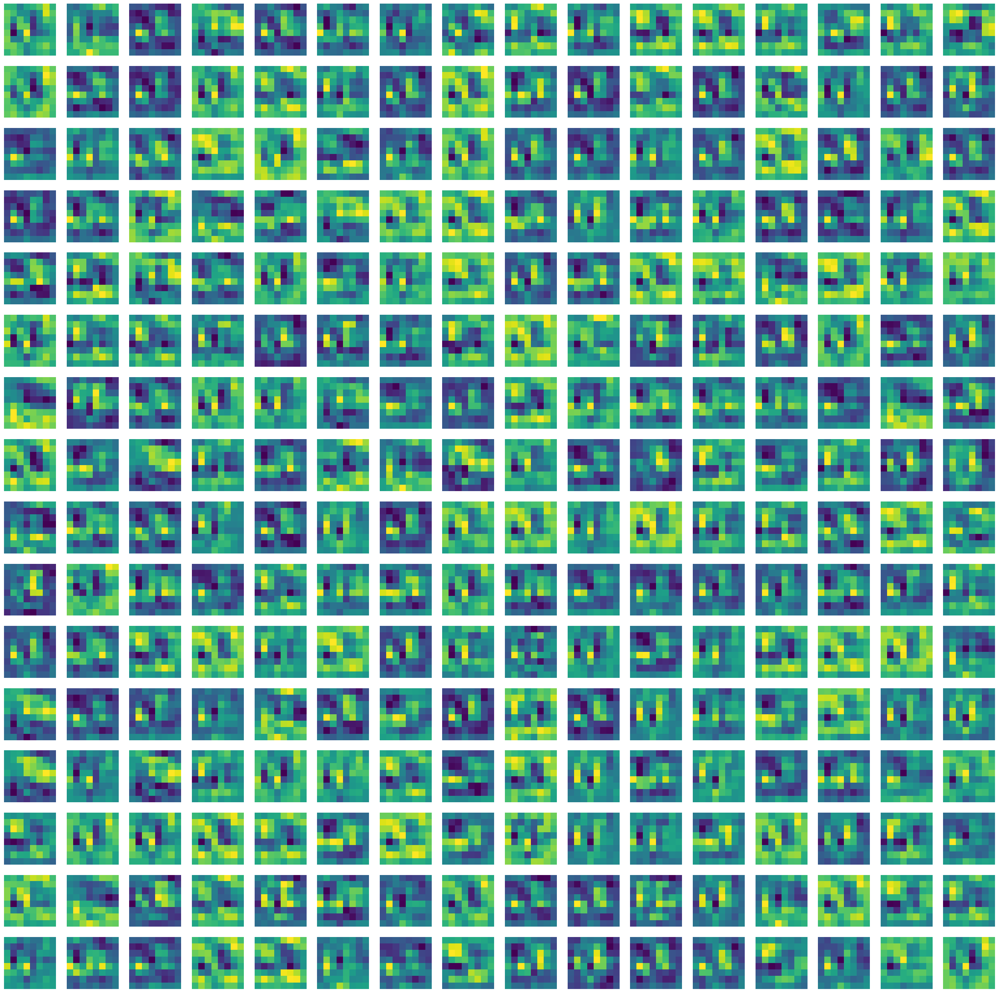

In [39]:
nc, nr = 16, 16
f, a = plt.subplots(nc, nr, figsize=(32, 32))
k = net.encoder.fiveth_layer.last_activation[0]
# len(k)
for i in range(len(k)):
    a[i//nr, i%nr].imshow(k[i])
    a[i//nr, i%nr].axis('off')

In [40]:
save_train_res(net, train_process)

# My CNN Only

# ResNet34 + Aug

In [11]:
rn34 = resnet34(pretrained=True)

for param in rn34.parameters():
    param.requires_grad = False
rn34

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 137MB/s] 


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [12]:
for i in rn34.layer4[2].parameters():
    i.requires_grad = True
rn34.fc = torch.nn.Sequential(
    torch.nn.Linear(512, 256),
    torch.nn.Tanh(),
    torch.nn.Linear(256,  128),
    torch.nn.Tanh(),
    torch.nn.Linear(128, 5),
    torch.nn.Softmax(1)
)
rn34.conv1 = torch.nn.Sequential(
    torch.nn.Conv2d(3, 4, kernel_size=(3, 3), padding=1),
    torch.nn.AvgPool2d((2, 2)),
    torch.nn.Conv2d(4, 8, kernel_size=(3, 3), padding=1),
    torch.nn.AvgPool2d((2, 2)),
    torch.nn.Conv2d(8, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
)
rn34 = rn34.to(0)

In [13]:
train_process = TrainResults('resnet34__transfom')

In [14]:
criterion = NN.MSELoss()
optimizer = optim.Adam(rn34.parameters(), lr=0.001)

In [15]:
loss_m = []
valid_loss_mean = []
valid_loss = []

In [16]:
for xb, yb in train_dataloader:
    break

In [17]:
with torch.no_grad():
    print(rn34(xb.to(0).float()).shape)

torch.Size([512, 5])


In [19]:
n_of_batches = 0
for e in tqdm(range(Parameters.epochs)):
  int_loss_m = []
  k = 0
  for xb, yb in train_dataloader:
    n_of_batches += 1
    outputs = rn34(xb.float().to(0))
    loss = criterion(outputs.to(0), yb.float().to(0))
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    loss_m.append(loss.item())
    train_process.train_losses.append(loss.item())
    int_loss_m.append(loss.item())
    if k > 50:
        break
    k += 1
  if e % 10 == 0:
    with torch.no_grad():
        g = []
        for xb, yb in test_dataloader:
            outputs = rn34(xb.float().to(0))
            loss = criterion(outputs.to(0), yb.float().to(0))
            g.append(loss.item())
            train_process.test_losses.append(loss.item())
        valid_loss_mean.append(np.mean(g))
        valid_loss += g
    print(e, 'avg_loss=', np.mean(loss_m), 'last_loss = ', loss.item(), 'min_loss = ', np.min(loss_m))
    print(e, 'int_loss_m__mean = ', np.mean(int_loss_m), 'int_loss_m__min = ', np.min(int_loss_m))
    print(e, 'int_loss_m__mean = ', np.mean(valid_loss), 'int_loss_m__min = ', np.min(valid_loss))
print('END', 'avg_loss=', np.mean(loss_m), 'last_loss = ', loss.item(), 'min_loss = ', np.min(loss_m))
save_train_res(rn34, train_process)

  0%|          | 1/300 [00:52<4:19:55, 52.16s/it]

0 avg_loss= 0.10512440551197931 last_loss =  0.09419968724250793 min_loss =  0.08920368552207947
0 int_loss_m__mean =  0.10061256214976311 int_loss_m__min =  0.08920368552207947
0 int_loss_m__mean =  0.10248825409346157 int_loss_m__min =  0.09419968724250793


  4%|▎         | 11/300 [09:04<4:01:22, 50.11s/it]

10 avg_loss= 0.09616021655656241 last_loss =  0.09217477589845657 min_loss =  0.07769262045621872
10 int_loss_m__mean =  0.09084644102874924 int_loss_m__min =  0.08320637792348862
10 int_loss_m__mean =  0.09927833328644435 int_loss_m__min =  0.08536644279956818


  7%|▋         | 21/300 [17:16<3:53:08, 50.14s/it]

20 avg_loss= 0.0927637600968501 last_loss =  0.08284507691860199 min_loss =  0.07502453774213791
20 int_loss_m__mean =  0.08707302589626874 int_loss_m__min =  0.07986053824424744
20 int_loss_m__mean =  0.09666750331719716 int_loss_m__min =  0.08284507691860199


 10%|█         | 31/300 [25:29<3:44:28, 50.07s/it]

30 avg_loss= 0.0904783549356611 last_loss =  0.08033468574285507 min_loss =  0.07219350337982178
30 int_loss_m__mean =  0.08323786758324679 int_loss_m__min =  0.07561055570840836
30 int_loss_m__mean =  0.09519310146570206 int_loss_m__min =  0.08033468574285507


 14%|█▎        | 41/300 [33:37<3:33:25, 49.44s/it]

40 avg_loss= 0.08867730556622795 last_loss =  0.08187735825777054 min_loss =  0.0699046328663826
40 int_loss_m__mean =  0.08235481534810628 int_loss_m__min =  0.07265397906303406
40 int_loss_m__mean =  0.09400416441537716 int_loss_m__min =  0.08033468574285507


 17%|█▋        | 51/300 [41:42<3:25:07, 49.43s/it]

50 avg_loss= 0.08707709124029649 last_loss =  0.0941695123910904 min_loss =  0.06882145255804062
50 int_loss_m__mean =  0.07923265305512092 int_loss_m__min =  0.06882145255804062
50 int_loss_m__mean =  0.09336366468951815 int_loss_m__min =  0.07988493889570236


 20%|██        | 61/300 [49:55<3:19:43, 50.14s/it]

60 avg_loss= 0.08568739191488572 last_loss =  0.08795192837715149 min_loss =  0.06754741072654724
60 int_loss_m__mean =  0.07726900871185695 int_loss_m__min =  0.07115694135427475
60 int_loss_m__mean =  0.09275052727510531 int_loss_m__min =  0.07988493889570236


 24%|██▎       | 71/300 [58:02<3:08:29, 49.38s/it]

70 avg_loss= 0.08436899597210747 last_loss =  0.09240257740020752 min_loss =  0.06317329406738281
70 int_loss_m__mean =  0.07480094779063673 int_loss_m__min =  0.06422644108533859
70 int_loss_m__mean =  0.09237427669174877 int_loss_m__min =  0.07988493889570236


 27%|██▋       | 81/300 [1:06:07<2:59:33, 49.20s/it]

80 avg_loss= 0.08313231518171826 last_loss =  0.0893486961722374 min_loss =  0.062360383570194244
80 int_loss_m__mean =  0.07275992609998759 int_loss_m__min =  0.0647016316652298
80 int_loss_m__mean =  0.09203302438060443 int_loss_m__min =  0.07988493889570236


 30%|███       | 91/300 [1:14:11<2:51:13, 49.16s/it]

90 avg_loss= 0.08193129987215458 last_loss =  0.07680248469114304 min_loss =  0.05952952057123184
90 int_loss_m__mean =  0.07113282426315196 int_loss_m__min =  0.06439115107059479
90 int_loss_m__mean =  0.09181847581357667 int_loss_m__min =  0.07680248469114304


 34%|███▎      | 101/300 [1:22:16<2:42:58, 49.14s/it]

100 avg_loss= 0.08074081059909373 last_loss =  0.08966868370771408 min_loss =  0.05704457685351372
100 int_loss_m__mean =  0.06851830651216648 int_loss_m__min =  0.06099586561322212
100 int_loss_m__mean =  0.09191354743584439 int_loss_m__min =  0.07680248469114304


 37%|███▋      | 111/300 [1:30:18<2:34:04, 48.91s/it]

110 avg_loss= 0.0795458483060476 last_loss =  0.09993589669466019 min_loss =  0.05593741685152054
110 int_loss_m__mean =  0.06672543385887847 int_loss_m__min =  0.05697442963719368
110 int_loss_m__mean =  0.0920556094019841 int_loss_m__min =  0.07680248469114304


 40%|████      | 121/300 [1:38:19<2:26:22, 49.06s/it]

120 avg_loss= 0.07840706700220987 last_loss =  0.09528549760580063 min_loss =  0.05184071138501167
120 int_loss_m__mean =  0.06444649168235414 int_loss_m__min =  0.05441523343324661
120 int_loss_m__mean =  0.0923809658085543 int_loss_m__min =  0.07680248469114304


 44%|████▎     | 131/300 [1:46:26<2:18:45, 49.27s/it]

130 avg_loss= 0.07727207303506542 last_loss =  0.10106915235519409 min_loss =  0.049806296825408936
130 int_loss_m__mean =  0.06178623777540291 int_loss_m__min =  0.049806296825408936
130 int_loss_m__mean =  0.09273236636762265 int_loss_m__min =  0.07680248469114304


 47%|████▋     | 141/300 [1:54:34<2:12:03, 49.83s/it]

140 avg_loss= 0.0761637042598654 last_loss =  0.10861646384000778 min_loss =  0.04934128746390343
140 int_loss_m__mean =  0.060702537789064294 int_loss_m__min =  0.053585704416036606
140 int_loss_m__mean =  0.09304542865397201 int_loss_m__min =  0.07680248469114304


 50%|█████     | 151/300 [2:02:41<2:02:37, 49.38s/it]

150 avg_loss= 0.07507649714500143 last_loss =  0.0926913321018219 min_loss =  0.04854608699679375
150 int_loss_m__mean =  0.05915991523686577 int_loss_m__min =  0.05037553980946541
150 int_loss_m__mean =  0.0933020996307236 int_loss_m__min =  0.07680248469114304


 51%|█████     | 152/300 [2:03:39<2:00:24, 48.82s/it]


KeyboardInterrupt: 

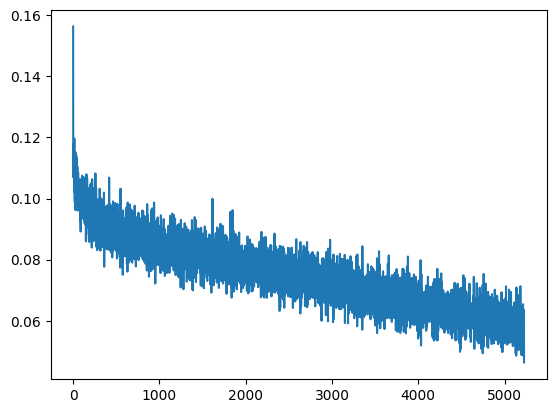

In [21]:
plt.plot(loss_m)

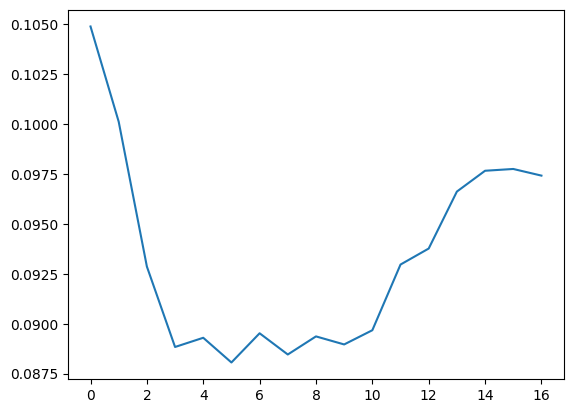

In [22]:
plt.plot(valid_loss_mean)

In [25]:
for x, y in test_dataset:
    break

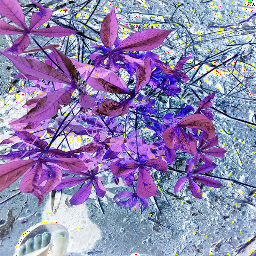

In [27]:
# rn34(x.float().unsqueeze(0).to(1))
to_pil_image(x.float())

In [32]:
c1 = rn34.conv1(x.float().unsqueeze(0).to(0))
bn1 = rn34.bn1(c1)
relu = rn34.relu(bn1)
maxpool = rn34.maxpool(relu)
layer1 = rn34.layer1(maxpool)
layer2 = rn34.layer2(layer1)
layer3 = rn34.layer3(layer2)
layer4 = rn34.layer4(layer3)

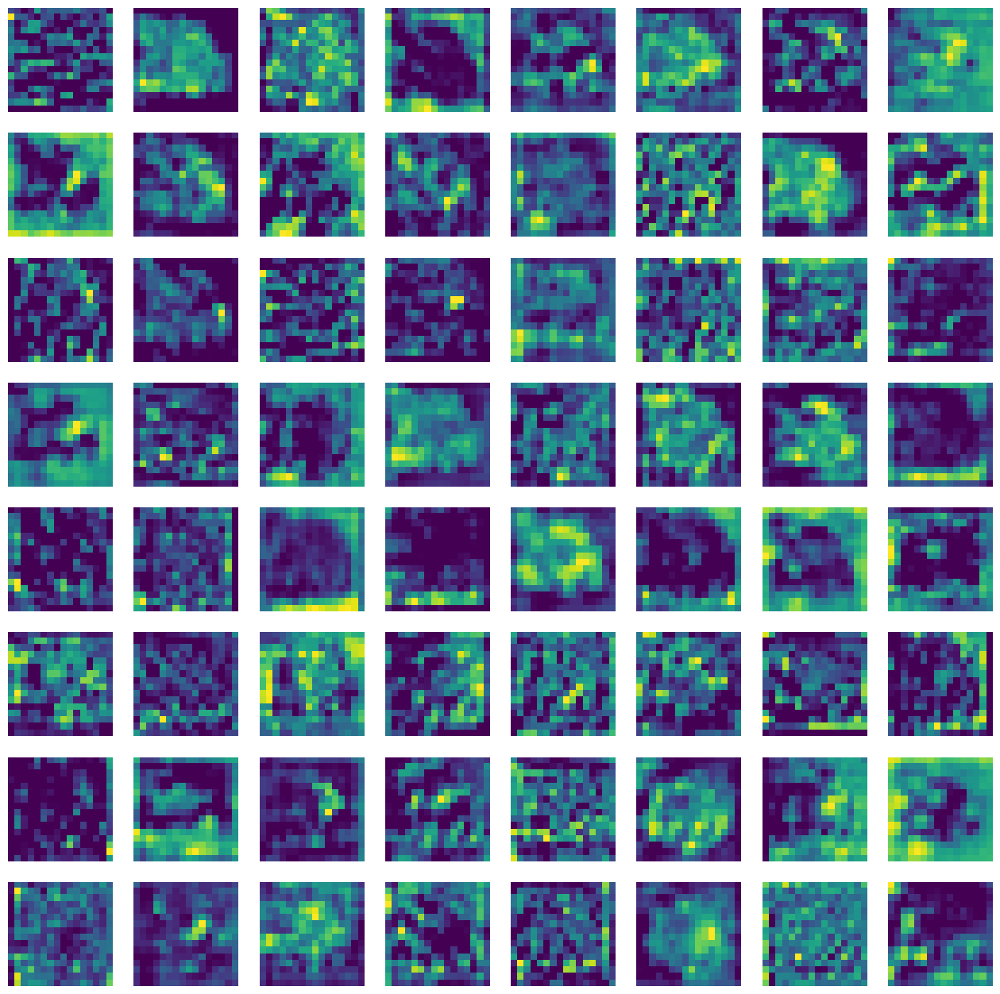

In [36]:
nc, nr = 8, 8
f, a = plt.subplots(nc, nr, figsize=(16, 16))
k = layer1.squeeze().to('cpu').detach()
# len(k)
for i in range(len(k)):
    a[i//nr, i%nr].imshow(k[i])
    a[i//nr, i%nr].axis('off')

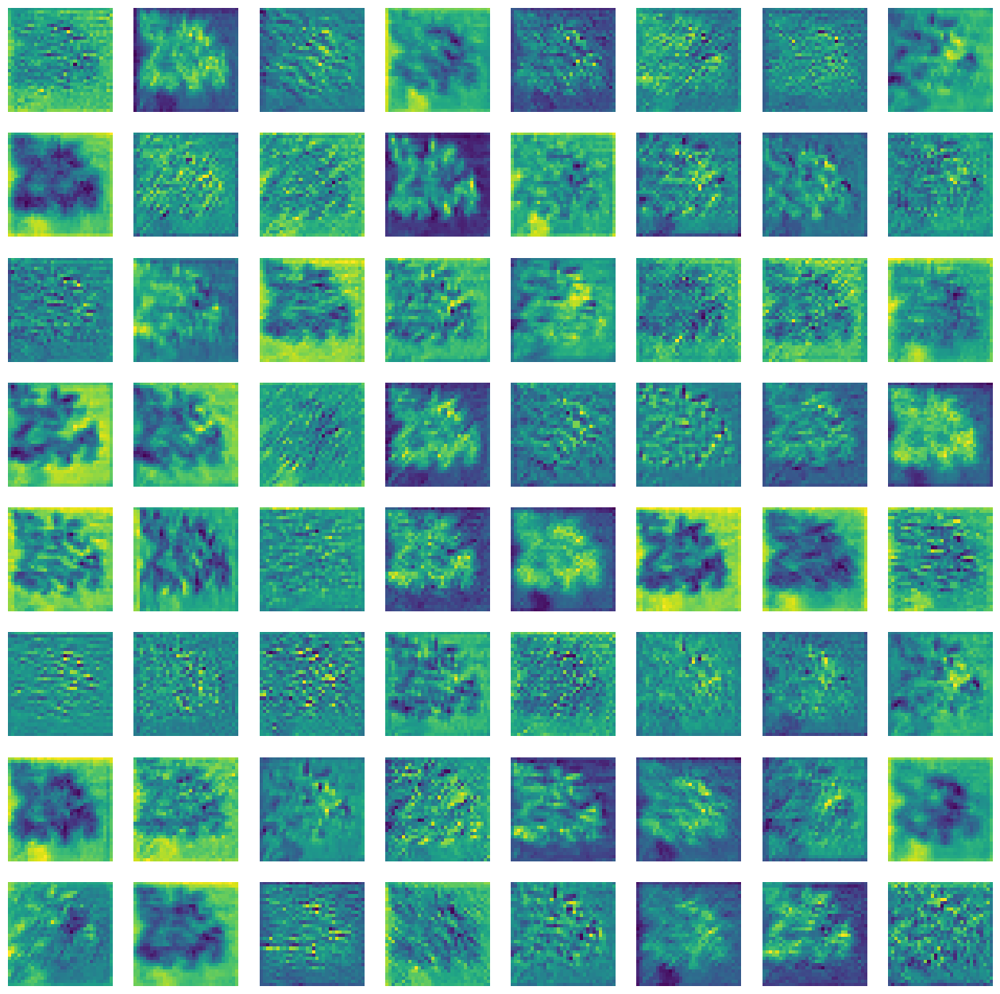

In [ ]:
nc, nr = 8, 8
f, a = plt.subplots(nc, nr, figsize=(16, 16))
k = c1.squeeze().to('cpu').detach()
# len(k)
for i in range(len(k)):
    a[i//nr, i%nr].imshow(k[i])
    a[i//nr, i%nr].axis('off')

In [20]:
save_train_res(rn34, train_process)

## Vgg + AUG + scheduler

In [23]:
vgg = torch.hub.load('pytorch/vision:v0.10.0', 'vgg19', pretrained=True)
vgg

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

In [24]:
for i in vgg.parameters():
    i.requires_grad = False
vgg.classifier = torch.nn.Sequential(
    torch.nn.Linear(25088, 4096),
    torch.nn.Tanh(),
    torch.nn.Linear(4096, 1024),
    torch.nn.Tanh(),
    torch.nn.Linear(1024,  256),
    torch.nn.Tanh(),
    torch.nn.Linear(256, 5),
    torch.nn.Softmax(1)
)
vgg.features[0] = torch.nn.Sequential(
    torch.nn.Conv2d(3, 4, kernel_size=(3, 3), padding=1),
    torch.nn.AvgPool2d((2, 2)),
    torch.nn.Conv2d(4, 8, kernel_size=(3, 3), padding=1),
    torch.nn.AvgPool2d((2, 2)),
    torch.nn.Conv2d(8, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
)
vgg = vgg.to(0)

In [19]:
train_process = TrainResults('vgg__transfom_scheduler')

In [81]:
criterion = NN.MSELoss()
optimizer = optim.Adam(vgg.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lambda epoch: 0.001 * 0.95 ** epoch)

In [25]:
for xb, yb in train_dataloader:
    break

In [26]:
with torch.no_grad():
    print(vgg(xb.to(0).float()).shape)

torch.Size([512, 5])


In [82]:
n_of_batches = 0
for e in tqdm(range(Parameters.epochs)):
  int_loss_m = []
  k = 0
  for xb, yb in train_dataloader:
    n_of_batches += 1
    outputs = vgg(xb.float().to(0))
    loss = criterion(outputs.to(0), yb.float().to(0))
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    loss_m.append(loss.item())
    train_process.train_losses.append(loss.item())
    int_loss_m.append(loss.item())
    if k > 50:
        break
    k += 1
  scheduler.step()
  if e % 10 == 0:
    with torch.no_grad():
        g = []
        for xb, yb in test_dataloader:
            outputs = vgg(xb.float().to(0))
            loss = criterion(outputs.to(0), yb.float().to(0))
            g.append(loss.item())
            train_process.test_losses.append(loss.item())
        valid_loss_mean.append(np.mean(g))
        valid_loss += g
    print(e, 'avg_loss=', np.mean(loss_m), 'last_loss = ', loss.item(), 'min_loss = ', np.min(loss_m))
    print(e, 'int_loss_m__mean = ', np.mean(int_loss_m), 'int_loss_m__min = ', np.min(int_loss_m))
    print(e, 'int_loss_m__mean = ', np.mean(valid_loss), 'int_loss_m__min = ', np.min(valid_loss))
print('END', 'avg_loss=', np.mean(loss_m), 'last_loss = ', loss.item(), 'min_loss = ', np.min(loss_m))
save_train_res(vgg, train_process)

  1%|          | 1/150 [00:56<2:20:05, 56.41s/it]

0 avg_loss= 0.1639632727490382 last_loss =  0.1180369034409523 min_loss =  0.10842417925596237
0 int_loss_m__mean =  0.12944417863207705 int_loss_m__min =  0.10842417925596237
0 int_loss_m__mean =  0.14306364208459854 int_loss_m__min =  0.11266811192035675


  7%|▋         | 11/150 [09:42<2:04:07, 53.58s/it]

10 avg_loss= 0.13564627658103207 last_loss =  0.11938893049955368 min_loss =  0.09828292578458786
10 int_loss_m__mean =  0.1121751078787972 int_loss_m__min =  0.10449741035699844
10 int_loss_m__mean =  0.13285105565079935 int_loss_m__min =  0.1044917106628418


 14%|█▍        | 21/150 [18:34<1:56:10, 54.04s/it]

20 avg_loss= 0.12691921576338308 last_loss =  0.12075028568506241 min_loss =  0.09828292578458786
20 int_loss_m__mean =  0.11101866294355954 int_loss_m__min =  0.10085580497980118
20 int_loss_m__mean =  0.12757263084252676 int_loss_m__min =  0.1044917106628418


 21%|██        | 31/150 [27:18<1:45:23, 53.14s/it]

30 avg_loss= 0.12257512724830276 last_loss =  0.10597408562898636 min_loss =  0.09828292578458786
30 int_loss_m__mean =  0.1100411268279833 int_loss_m__min =  0.10009043663740158
30 int_loss_m__mean =  0.12413172357612186 int_loss_m__min =  0.1044917106628418


 27%|██▋       | 41/150 [36:06<1:38:08, 54.02s/it]

40 avg_loss= 0.11997345351392533 last_loss =  0.11034827679395676 min_loss =  0.09776651114225388
40 int_loss_m__mean =  0.10973731779000338 int_loss_m__min =  0.09949856251478195
40 int_loss_m__mean =  0.12186584359517803 int_loss_m__min =  0.0993005558848381


 34%|███▍      | 51/150 [44:55<1:28:49, 53.84s/it]

50 avg_loss= 0.11822198866191828 last_loss =  0.10820259153842926 min_loss =  0.09751486033201218
50 int_loss_m__mean =  0.11000280323273995 int_loss_m__min =  0.10086487978696823
50 int_loss_m__mean =  0.12020710855722427 int_loss_m__min =  0.0993005558848381


 41%|████      | 61/150 [53:47<1:20:17, 54.13s/it]

60 avg_loss= 0.11698333346125467 last_loss =  0.10853829234838486 min_loss =  0.09751486033201218
60 int_loss_m__mean =  0.11005634836414281 int_loss_m__min =  0.10213983058929443
60 int_loss_m__mean =  0.11896179202530119 int_loss_m__min =  0.0993005558848381


 47%|████▋     | 71/150 [1:02:40<1:11:17, 54.15s/it]

70 avg_loss= 0.11604211089867306 last_loss =  0.10122185200452805 min_loss =  0.09751486033201218
70 int_loss_m__mean =  0.10938167791156207 int_loss_m__min =  0.10148447006940842
70 int_loss_m__mean =  0.11792967542086119 int_loss_m__min =  0.0993005558848381


 54%|█████▍    | 81/150 [1:11:28<1:01:46, 53.72s/it]

80 avg_loss= 0.11532912546021107 last_loss =  0.1178634911775589 min_loss =  0.09751486033201218
80 int_loss_m__mean =  0.10961201918475769 int_loss_m__min =  0.10020013153553009
80 int_loss_m__mean =  0.11722062751650811 int_loss_m__min =  0.0993005558848381


 61%|██████    | 91/150 [1:20:17<52:52, 53.77s/it]  

90 avg_loss= 0.11473277206038583 last_loss =  0.1135503500699997 min_loss =  0.0973566547036171
90 int_loss_m__mean =  0.10945540359791588 int_loss_m__min =  0.10385198891162872
90 int_loss_m__mean =  0.11661178069283264 int_loss_m__min =  0.0993005558848381


 67%|██████▋   | 101/150 [1:29:04<43:52, 53.72s/it]

100 avg_loss= 0.11425158575091858 last_loss =  0.1006026342511177 min_loss =  0.09231216460466385
100 int_loss_m__mean =  0.10960883471895666 int_loss_m__min =  0.09991913288831711
100 int_loss_m__mean =  0.11602666525653114 int_loss_m__min =  0.0993005558848381


 74%|███████▍  | 111/150 [1:37:51<34:48, 53.55s/it]

110 avg_loss= 0.1138567093946644 last_loss =  0.12940865755081177 min_loss =  0.09231216460466385
110 int_loss_m__mean =  0.10975393674829427 int_loss_m__min =  0.1025812029838562
110 int_loss_m__mean =  0.11568871299680482 int_loss_m__min =  0.0993005558848381


 81%|████████  | 121/150 [1:46:39<26:00, 53.82s/it]

120 avg_loss= 0.1135190055459868 last_loss =  0.10398133844137192 min_loss =  0.09231216460466385
120 int_loss_m__mean =  0.10952288788907669 int_loss_m__min =  0.10190138965845108
120 int_loss_m__mean =  0.11526955504502569 int_loss_m__min =  0.0993005558848381


 87%|████████▋ | 131/150 [1:55:38<17:25, 55.00s/it]

130 avg_loss= 0.11323683866756111 last_loss =  0.1132088154554367 min_loss =  0.09231216460466385
130 int_loss_m__mean =  0.10966545518706827 int_loss_m__min =  0.1007906123995781
130 int_loss_m__mean =  0.1149499601787991 int_loss_m__min =  0.0993005558848381


 94%|█████████▍| 141/150 [2:04:33<08:10, 54.51s/it]

140 avg_loss= 0.11299514631930274 last_loss =  0.09984289854764938 min_loss =  0.09231216460466385
140 int_loss_m__mean =  0.10979478126939606 int_loss_m__min =  0.10273682326078415
140 int_loss_m__mean =  0.11461091574488415 int_loss_m__min =  0.0993005558848381


100%|██████████| 150/150 [2:12:32<00:00, 53.02s/it]


END avg_loss= 0.11280671265706232 last_loss =  0.10761508345603943 min_loss =  0.09231216460466385


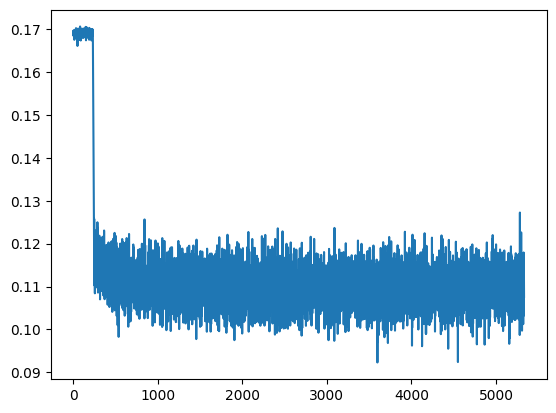

In [83]:
plt.plot(loss_m)

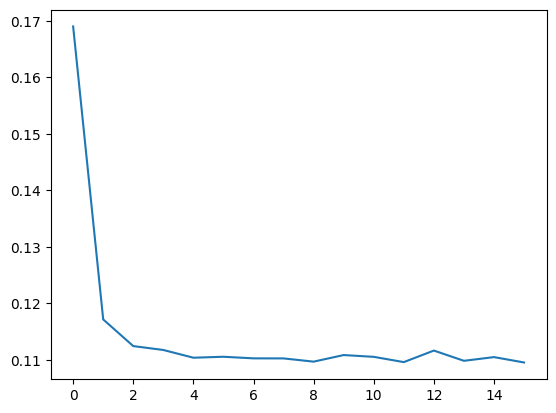

In [84]:
plt.plot(valid_loss_mean)

In [85]:
for x, y in test_dataset:
    break

In [86]:
vgg

VGG(
  (features): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): AvgPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0)
      (2): Conv2d(4, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): AvgPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0)
      (4): Conv2d(8, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    )
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), 

In [88]:
l1 = vgg.features[0](x.float().unsqueeze(0).to(0))
l2 = vgg.features[0:6](x.float().unsqueeze(0).to(0))
l3 = vgg.features[0:10](x.float().unsqueeze(0).to(0))
l4 = vgg.features[0:15](x.float().unsqueeze(0).to(0))


In [95]:
l3.shape

torch.Size([1, 128, 8, 8])

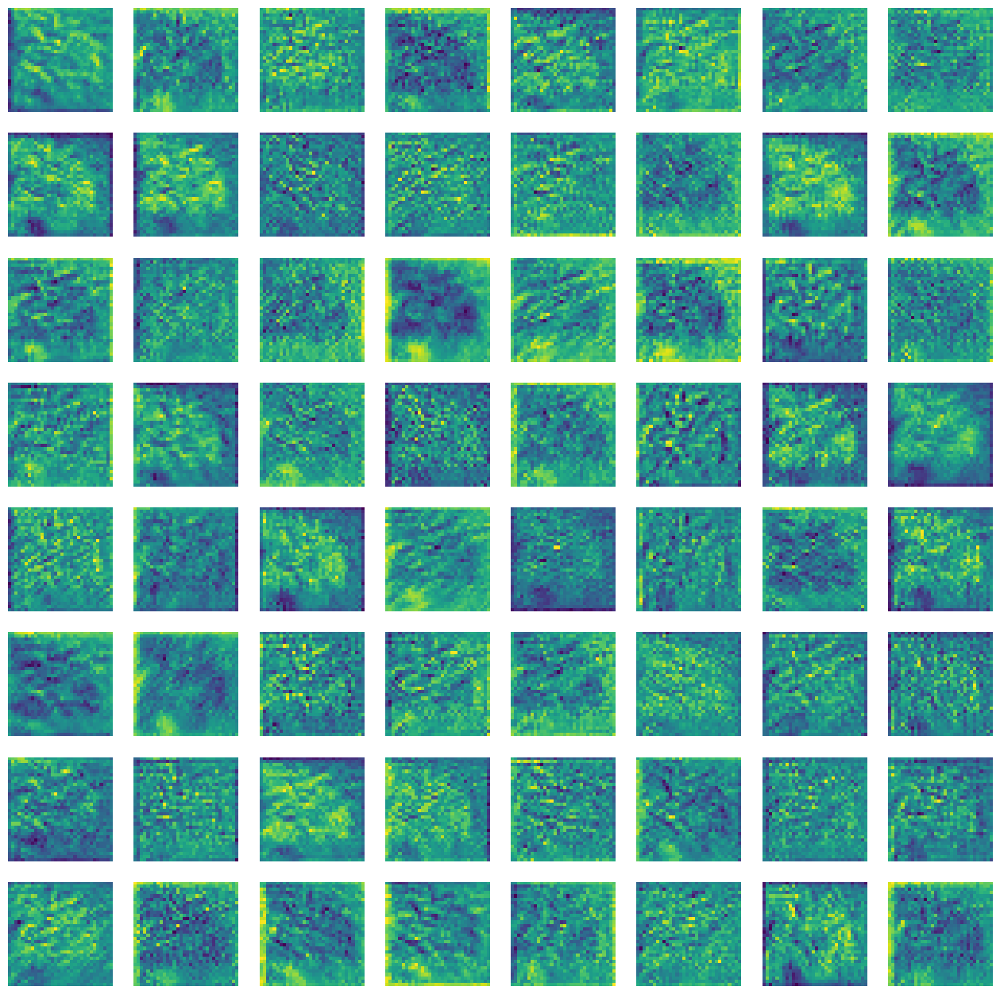

In [91]:
nc, nr = 8, 8
f, a = plt.subplots(nc, nr, figsize=(16, 16))
k = l1.squeeze().to('cpu').detach()
# len(k)
for i in range(len(k)):
    a[i//nr, i%nr].imshow(k[i])
    a[i//nr, i%nr].axis('off')

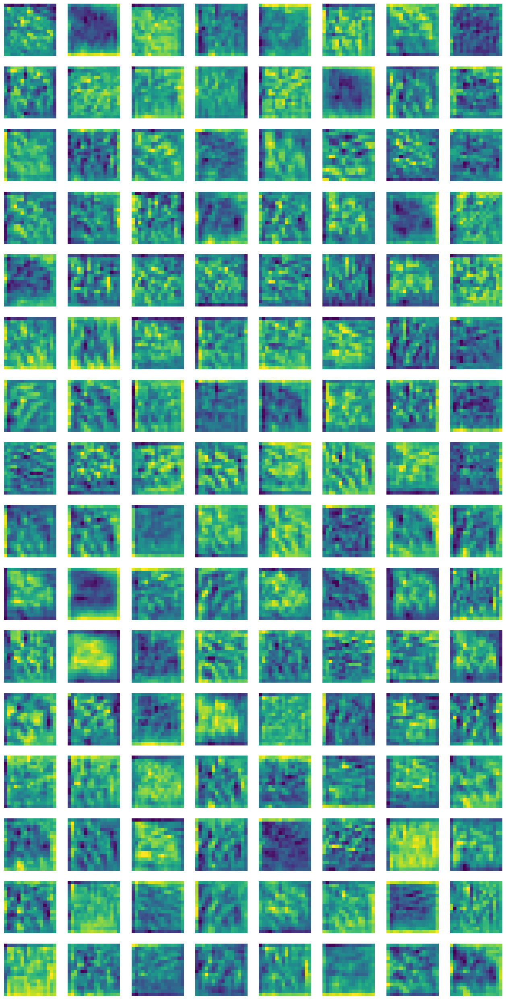

In [97]:
nc, nr = 16, 8
f, a = plt.subplots(nc, nr, figsize=(16, 32))
k = l2.squeeze().to('cpu').detach()
# len(k)
for i in range(len(k)):
    a[i//nr, i%nr].imshow(k[i])
    a[i//nr, i%nr].axis('off')